In [1]:
#clone YOLOv5 and 
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
%pip install -qr requirements.txt # install dependencies
%pip install -q roboflow

import torch
import os
from IPython.display import Image, clear_output  # to display images

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Cloning into 'yolov5'...
remote: Enumerating objects: 15968, done.
remote: Counting objects: 100% (137/137), done.
remote: Compressing objects: 100% (62/62), done.
remote: Total 15968 (delta 84), reused 113 (delta 75), pack-reused 15831
Receiving objects: 100% (15968/15968), 14.60 MiB | 17.49 MiB/s, done.
Resolving deltas: 100% (10953/10953), done.
/content/yolov5
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 184.3/184.3 kB 18.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 595.4/595.4 kB 38.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 8.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 kB 5.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 7.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 9.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 7.3 MB/s eta 0:00:00
Setup complete. Using torch 2.

In [2]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="lhrQfa5BnP7A6SAJGFtn")
project = rf.workspace("fun-for-me").project("faces-yce7c")
dataset = project.version(4).download("yolov5")

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
loading Roboflow workspace...
loading Roboflow project...

Extracting Dataset Version Zip to Faces-4 in yolov5pytorch:: 100%|██████████| 33642/33642 [00:06<00:00, 5410.44it/s] 


In [3]:
!python train.py --img 250 --batch 16 --epochs 10 --data /content/yolov5/Faces-4/data.yaml --weights yolov5s.pt --cache

train: weights=yolov5s.pt, cfg=, data=/content/yolov5/Faces-4/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=10, batch_size=16, imgsz=250, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-176-g76ea9ed Python-3.10.11 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, h

In [5]:
#export your model's weights for future use
from google.colab import files
files.download('./runs/train/exp/weights/best.pt') 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [6]:
!python /content/yolov5/detect.py --weights /content/best.pt --img 300 --conf 0.1 --source /content/yolov5/Faces-4/test/expuni

detect: weights=['/content/best.pt'], source=/content/yolov5/Faces-4/test/expuni, data=data/coco128.yaml, imgsz=[300, 300], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-176-g76ea9ed Python-3.10.11 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
WARNING ⚠️ --img-size [300, 300] must be multiple of max stride 32, updating to [320, 320]
image 1/30 /content/yolov5/Faces-4/test/expuni/1.jpeg: 320x128 3 Hombres, 1 Mujer, 36.4ms
image 2/30 /content/yolov5/Faces-4/test/expuni/10.jpeg: 320x160 2 Hombres, 1 Mujer, 52.0ms
image 3/30 /content/yolov5/Faces-4/test/expuni/11.jpeg: 128x320 1 Hombre,

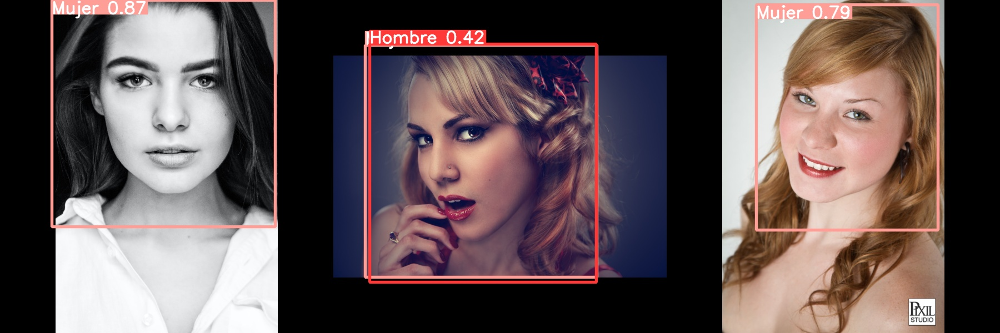

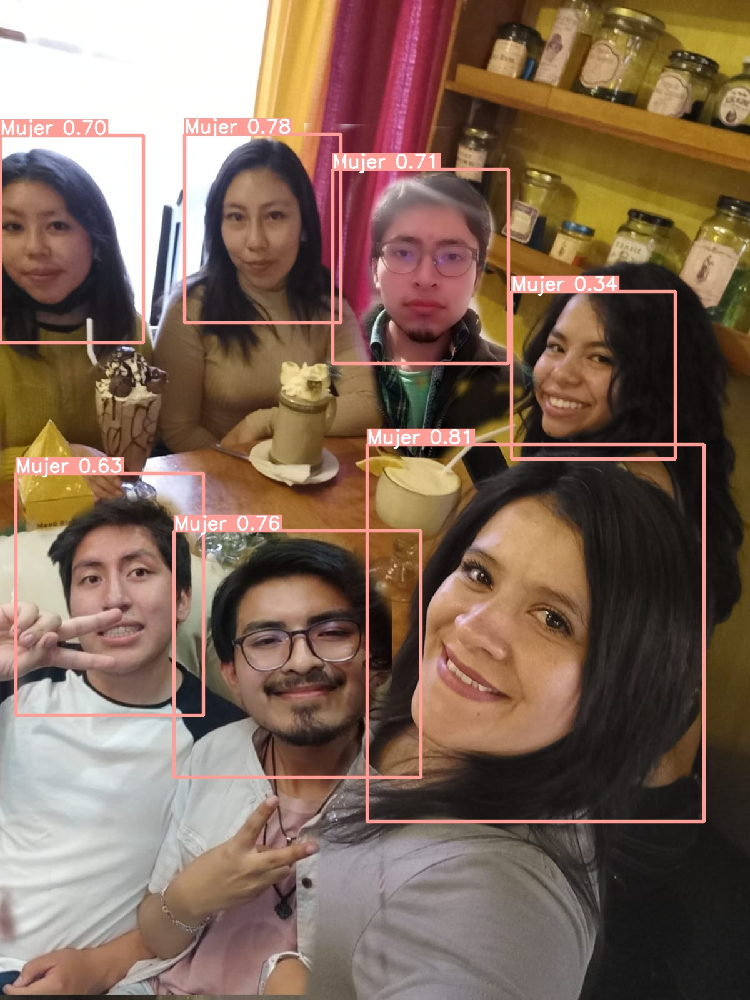

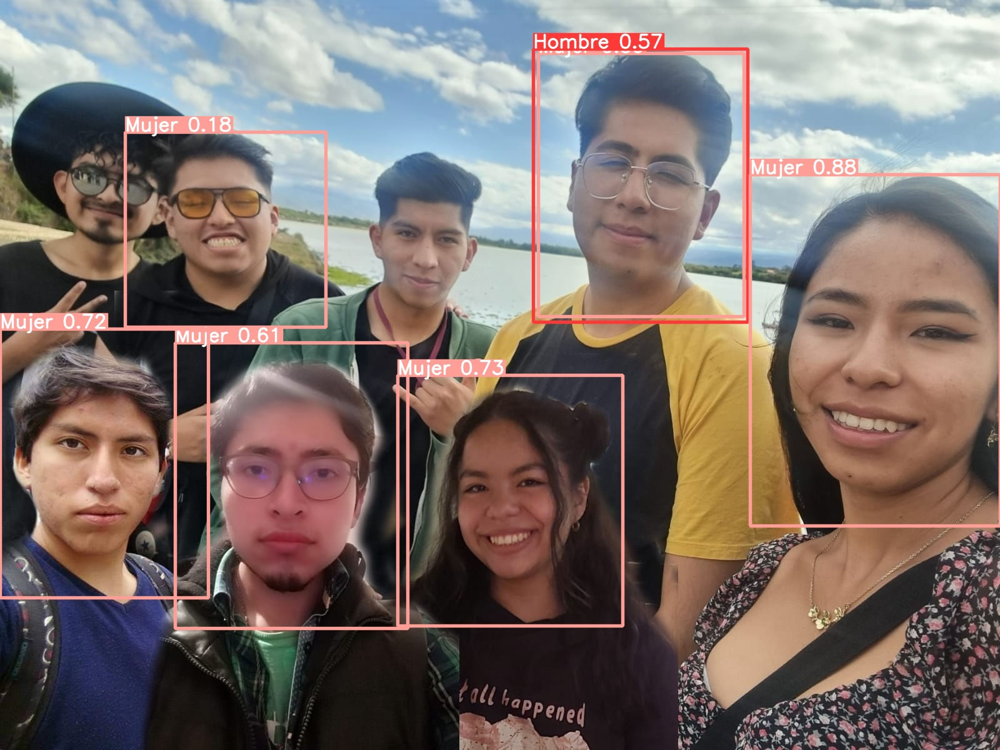

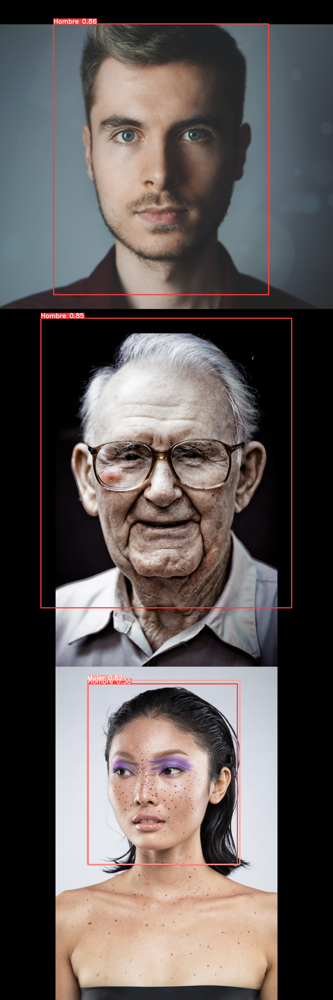

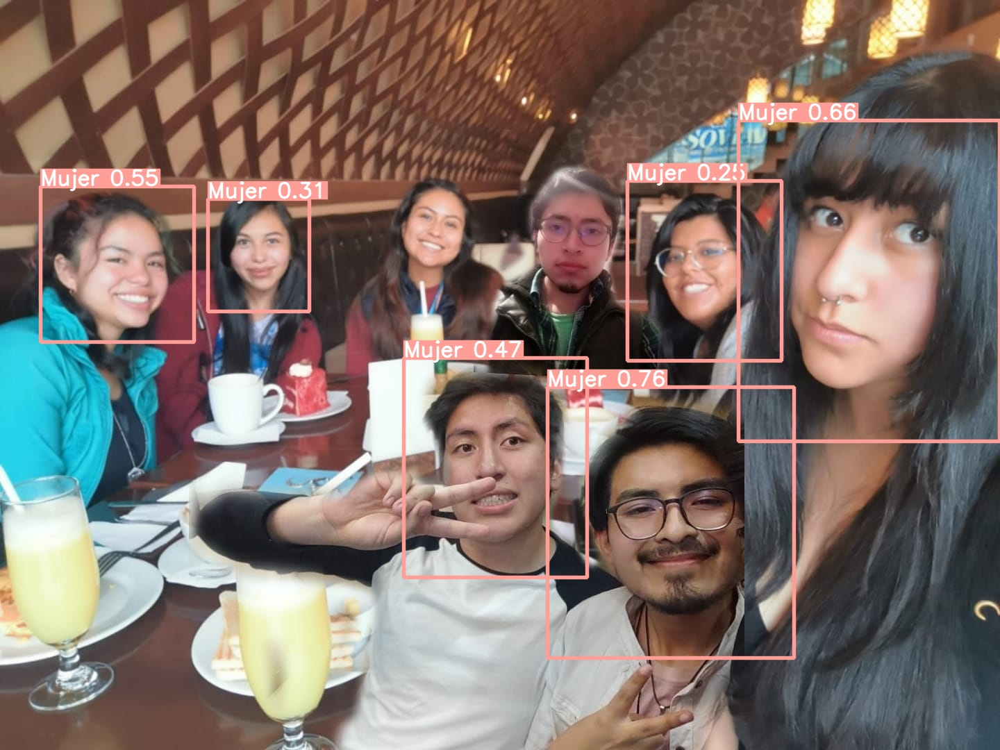

...

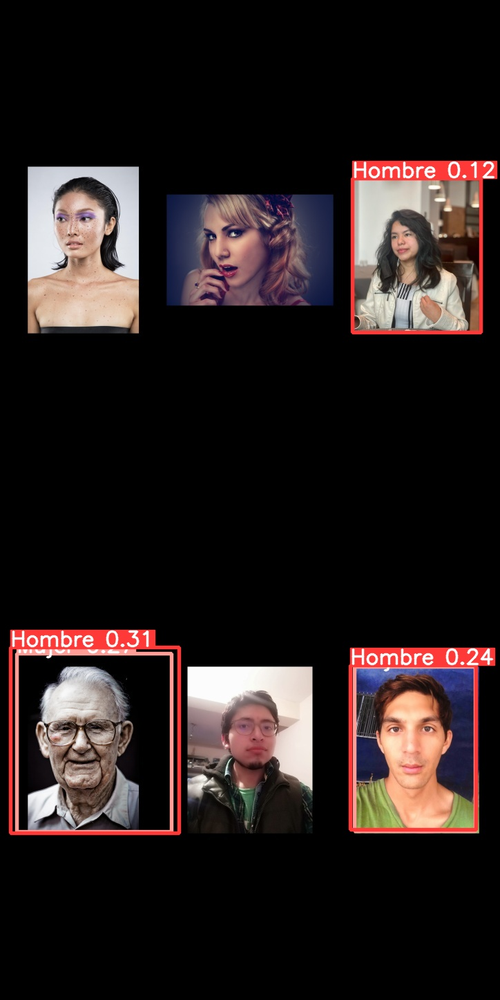

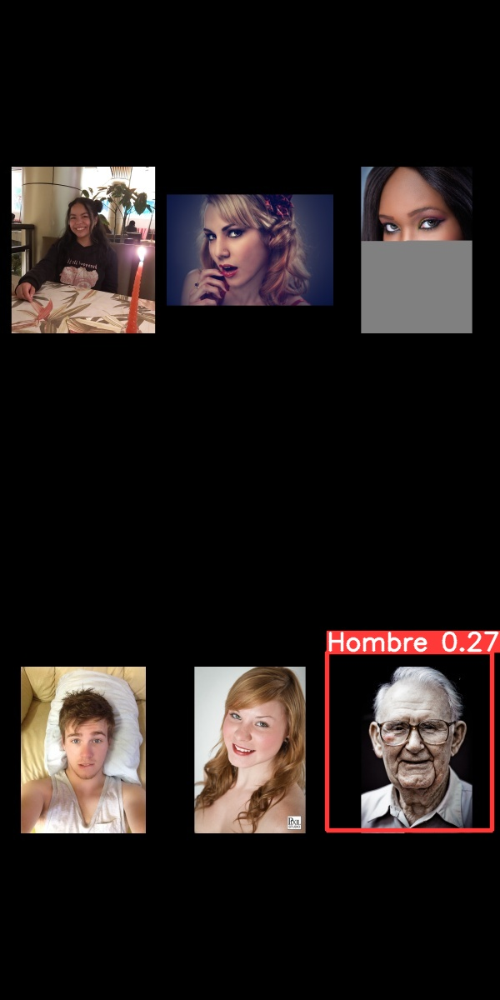

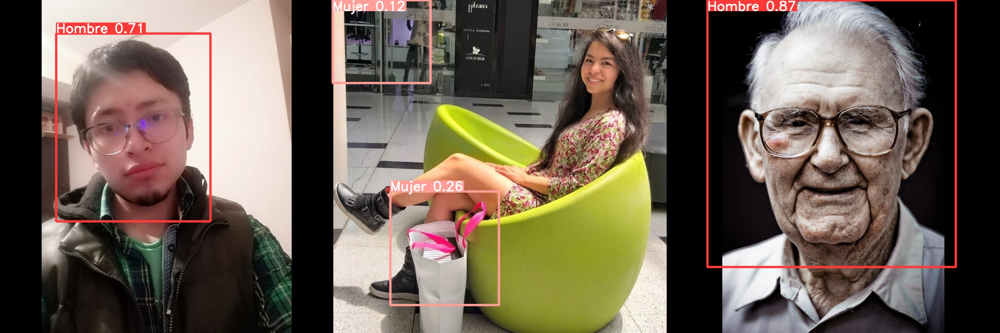

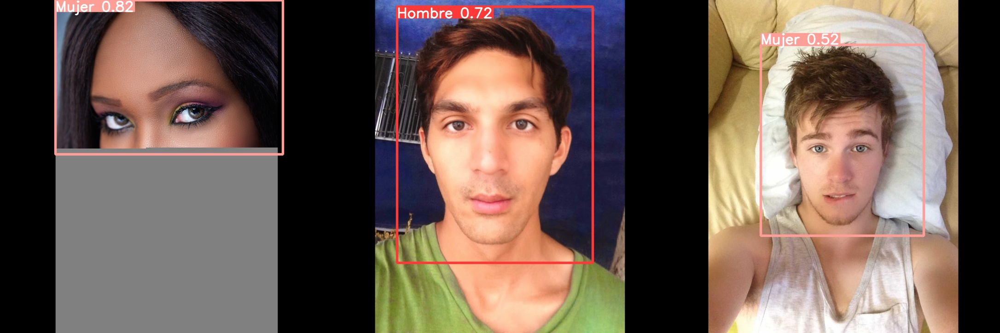

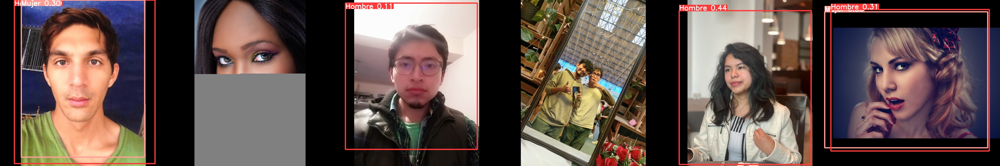

In [7]:
import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp2/*.jpeg'):
  display(Image(filename=imageName))
  print("\n")